This notebook uses the heat equation simulator from tehe file simulation_class to make a series of numerical variants of a heat equation process, given by $\frac{\partial}{\partial t}u(t,x) = \nabla_x u(t,x)$. This process is viewed as a time series $(H_t)_{t=1}^T$. Numerically, one can see the numerical solver of the form $H_{t+1}=H_t+g(H_t)$, suggesting a residual connection in the network so that only $g$ is to be learned.

The goal is to learn a neural network that learns the physical process $g$. For now, we do this using convolutional networks of varying depth with a residual connection. As of a depth of 7 convolutoinal layers, a network good enough is learned to, visuaully indistinguishable, model the time series. De note the trained network as a function $\varphi$, we want to start from the initial state $H_0$ and iteratively apply the network to approximate $H_T$. Keep in mind that the errors will accumulate as transforming $H_0$ to $H_T$ applies $\varphi$ $T$ times, $\tilde H_t=\varphi^T(H_0)$

Results are seen in an animation below

In [ ]:
import os
import csv
import time
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torch.nn.utils import clip_grad_norm_

from utils import print_model_information, make_simulations, generate_gaussian_peaks, solve_heat_equation_2d, solve_wave_equation_2d

from simulation_class import SimulationModel

from network_architectures import (
    WaveEquationSurrogateLinear,
    MultiLayerConvolutional,
    SurrogateEncodeDecode,
    SurrogateUNet
    )

# Print number of parameters for each model and their output shapes
print_model_information(MultiLayerConvolutional(convlayers=1))
print_model_information(MultiLayerConvolutional(convlayers=3))
print_model_information(MultiLayerConvolutional(convlayers=5))
print_model_information(MultiLayerConvolutional(convlayers=7))

print_model_information(WaveEquationSurrogateLinear())

print_model_information(SurrogateEncodeDecode())
print_model_information(SurrogateUNet())

# # Generate training data
equation_type = "heat"
equation_parameter = 3

In [ ]:
inputs_train, output_train = make_simulations(number=200, k=1, nt=150, equation=equation_type, equation_parameter=equation_parameter, as_tensor=True)

torch.save({
    'inputs_train': inputs_train,
    'output_train': output_train
}, './data/train_test_data.pth')

permute = torch.randperm(inputs_train.size(0))
permute_reverse = torch.argsort(permute)

In [4]:
inputs_train, output_train = torch.load('./data/train_test_data.pth').values()

### What would the error be is the neural net just learns nn(x)=x?
print(1e6*torch.mean((inputs_train - output_train)**2)) # approximately 1

tensor(1.0108)


Below we make almost the simplest convolutional neural network possible. 

One convolutional kernel with size 7. One kernel combining the channels

All kernel sizes are taken at 7. The model MultiLayerConvolutional starts with a convolutional layer expanding the number of channels from 1 to 8. The argument *convlayers* changes the total number of convolutional layers with a kernel larger than 1. This way we can see how the increasing complexity of the (fully convolutional) network helps to model the data.

The model is designed such that each layer outputs the same dimension as it has received as input.

In [4]:
model_onelayerconvolutional = SimulationModel(inputs_train, output_train,
    model = MultiLayerConvolutional(convlayers=1),
    load_model_parameters=True, 
    equation=equation_type, 
    equation_parameter=equation_parameter)

model_onelayerconvolutional.train(num_epochs=500, print_every=25, save_model=True)
model_onelayerconvolutional.plot_errors(skip_first=5, save_training_plot=True)
model_onelayerconvolutional.animate_solution(save_animation=True)

MovieWriter ffmpeg unavailable; using Pillow instead.


In [5]:
model_threelayerconvolutional = SimulationModel(inputs_train, output_train,
    model = MultiLayerConvolutional(convlayers=3),
    load_model_parameters=True, 
    equation=equation_type, 
    equation_parameter=equation_parameter)

model_threelayerconvolutional.train(num_epochs=100, print_every=25, save_model=True)
model_threelayerconvolutional.plot_errors(skip_first=5, save_training_plot=True)
model_threelayerconvolutional.animate_solution(save_animation=True)

Loading parameters of the previously fit model.
Epoch [25/100] | Train Loss: 0.0348 | Test Loss: 0.0145 | Total time 32.70 min at 78.6 sec per epoch (error is *10e6)
Epoch [50/100] | Train Loss: 0.0031 | Test Loss: 0.0018 | Total time 66.00 min at 79.2 sec per epoch (error is *10e6)
Epoch [75/100] | Train Loss: 0.0014 | Test Loss: 0.0004 | Total time 97.60 min at 78.1 sec per epoch (error is *10e6)
Epoch [100/100] | Train Loss: 0.0004 | Test Loss: 0.0005 | Total time 155.20 min at 93.1 sec per epoch (error is *10e6)


MovieWriter ffmpeg unavailable; using Pillow instead.


Same model as above, but with three convolutional layers instead of 3. All intermediate layers have 8 channels.

In [ ]:
model_fivelayerconvolutional = SimulationModel(inputs_train, output_train,
    model = MultiLayerConvolutional(convlayers=5),
    load_model_parameters=True, 
    equation=equation_type, 
    equation_parameter=equation_parameter)

model_fivelayerconvolutional.train(num_epochs=100, print_every=10, save_model=True)
model_fivelayerconvolutional.plot_errors(skip_first=5, save_training_plot=True)
model_fivelayerconvolutional.animate_solution(save_animation = True)

In [6]:
model_sevenlayerconvolutional = SimulationModel(inputs_train, output_train,
    model = MultiLayerConvolutional(convlayers=7),
    load_model_parameters=True, 
    equation=equation_type, 
    equation_parameter=equation_parameter)

model_sevenlayerconvolutional.train(num_epochs=100, print_every=10, save_model=True)
model_sevenlayerconvolutional.plot_errors(skip_first=5, save_training_plot=True)
model_sevenlayerconvolutional.animate_solution(save_animation = True)

Epoch [10/100] | Train Loss: 0.1840 | Test Loss: 0.0837 | Total time 55.50 min at 332.9 sec per epoch (error is *10e6)
Epoch [20/100] | Train Loss: 0.3456 | Test Loss: 0.2420 | Total time 111.10 min at 333.4 sec per epoch (error is *10e6)
Epoch [30/100] | Train Loss: 0.0101 | Test Loss: 0.0071 | Total time 213.50 min at 427.0 sec per epoch (error is *10e6)
Epoch [40/100] | Train Loss: 0.0033 | Test Loss: 0.0026 | Total time 290.50 min at 435.7 sec per epoch (error is *10e6)
Epoch [50/100] | Train Loss: 0.0025 | Test Loss: 0.0012 | Total time 361.20 min at 433.4 sec per epoch (error is *10e6)
Epoch [60/100] | Train Loss: 0.0015 | Test Loss: 0.0021 | Total time 449.50 min at 449.5 sec per epoch (error is *10e6)
Epoch [70/100] | Train Loss: 0.0010 | Test Loss: 0.0010 | Total time 541.50 min at 464.1 sec per epoch (error is *10e6)
Epoch [80/100] | Train Loss: 0.0010 | Test Loss: 0.0010 | Total time 610.60 min at 458.0 sec per epoch (error is *10e6)
Epoch [90/100] | Train Loss: 0.0007 | Tes

MovieWriter ffmpeg unavailable; using Pillow instead.


In [5]:
model_ninelayerconvolutional = SimulationModel(inputs_train, output_train,
    model = MultiLayerConvolutional(convlayers=9),
    load_model_parameters=True, 
    equation=equation_type, 
    equation_parameter=equation_parameter)

model_ninelayerconvolutional.train(num_epochs=100, print_every=10, save_model=True)
model_ninelayerconvolutional.plot_errors(skip_first=5, save_training_plot=True)
model_ninelayerconvolutional.animate_solution(save_animation = True)

# Lijkt alsof er g(u)=0 wordt geleerd, zodat u_{t+1}=u_t+g(u_t)=u_t.z

Loading parameters of the previously fit model.
Epoch [10/100] | Train Loss: 0.0244 | Test Loss: 0.0145 | Total time 172.50 min at 1034.8 sec per epoch (error is *10e6)


: 

Perhaps it may be useful to compress the data into a smaller dimension, and deconvolute to the original. The next network uses 4 convolutional layers to compress the 1x100x100 image to 32x13x13 images followed by 4 deconvolutation layers to bring the dimensionality back to 1x100x100.

Maybe 32x13x13 is still a little much. Why not get it to 32x8x8?

Epoch [10/500] | Train Loss: 9388.6640 | Test Loss: 8419.0010 | Total time 0.70 min at 4.4 sec per epoch (error is *10e6)
Epoch [20/500] | Train Loss: 518.7019 | Test Loss: 421.0192 | Total time 1.50 min at 4.4 sec per epoch (error is *10e6)
Epoch [30/500] | Train Loss: 25.0379 | Test Loss: 22.7309 | Total time 2.10 min at 4.3 sec per epoch (error is *10e6)
Epoch [40/500] | Train Loss: 22.7457 | Test Loss: 22.4338 | Total time 2.80 min at 4.2 sec per epoch (error is *10e6)
Epoch [50/500] | Train Loss: 16.3246 | Test Loss: 18.3370 | Total time 3.50 min at 4.2 sec per epoch (error is *10e6)
Epoch [60/500] | Train Loss: 17.0293 | Test Loss: 13.0265 | Total time 4.10 min at 4.1 sec per epoch (error is *10e6)
Epoch [70/500] | Train Loss: 14.8179 | Test Loss: 17.8659 | Total time 4.70 min at 4.0 sec per epoch (error is *10e6)
Epoch [80/500] | Train Loss: 15.1801 | Test Loss: 17.5172 | Total time 5.20 min at 3.9 sec per epoch (error is *10e6)
Epoch [90/500] | Train Loss: 12.0039 | Test Loss: 

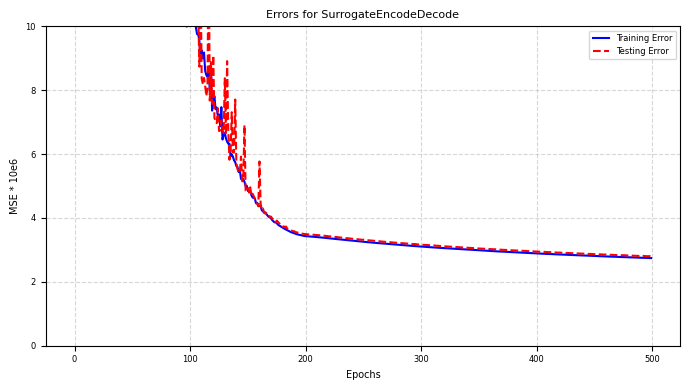

In [9]:
model_encodedecode = SimulationModel(inputs_train, output_train,
    model=SurrogateEncodeDecode(),
    load_model_parameters=False)

model_encodedecode.train(num_epochs=500, print_every=10, save_model=True)

model_encodedecode.plot_errors()

# model_surrogate1.animate_solution()

We can also draw inspiration from UNets, originally designed to color specific regions in images (locating and marking tumors, for example). This network works similarly to the EncodeDecode network, it first encodes the network en then decodes. The network is typically drawn like a U-shape. The higher in the sticks of the U, the less compressed.

In the middle of the U, there is a bottleneck, which has the highest level of encoding. Corresponding levels of the encoding and decoding part are related to eachother. 

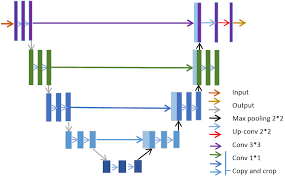

In [ ]:
import torch
import torch.nn as nn

class DoubleConv(nn.Module):
    def __init__(self, input_channel, output_channel):
        super().__init__()
        self.network = nn.Sequential(
            nn.Conv2d(input_channel, output_channel, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(output_channel, output_channel, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.network(x)
        
class SurrogateUNet(nn.Module):
    def __init__(self):
        super(SurrogateUNet, self).__init__()
        
        self.model_name = "SurrogateUNet"
        
        # Encoder Path with reduced channels
        self.encode1 = DoubleConv(1, 4)   # Reduced channels here
        self.pool1 = nn.MaxPool2d(2)
        self.encode2 = DoubleConv(4, 8)   # Reduced channels here
        self.pool2 = nn.MaxPool2d(2)
        self.encode3 = DoubleConv(8, 16)  # Reduced channels here
        self.pool3 = nn.MaxPool2d(2)
        self.encode4 = DoubleConv(16, 32) # Reduced channels here
        self.pool4 = nn.MaxPool2d(2)
        
        # Bottleneck with reduced channels
        self.bottleneck = DoubleConv(32, 64)  # Reduced channels here
        
        # Decoder Path with reduced channels
        self.upconv4 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2, output_padding=0)
        self.decode4 = DoubleConv(64, 32)  # Reduced channels here
        self.upconv3 = nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2, output_padding=1)
        self.decode3 = DoubleConv(32, 16)  # Reduced channels here
        self.upconv2 = nn.ConvTranspose2d(16, 8, kernel_size=2, stride=2, output_padding=0)
        self.decode2 = DoubleConv(16, 8)   # Reduced channels here
        self.upconv1 = nn.ConvTranspose2d(8, 4, kernel_size=2, stride=2, output_padding=0)
        self.decode1 = DoubleConv(8, 4)    # Reduced channels here
        
        # Final convolution
        self.final_conv = nn.Conv2d(4, 1, kernel_size=1)
    
    def forward(self, x):
        # Encoder with reduced channels
        encode1 = self.encode1(x)
        encode1_pool = self.pool1(encode1)
        encode2 = self.encode2(encode1_pool)
        encode2_pool = self.pool2(encode2)
        encode3 = self.encode3(encode2_pool)
        encode3_pool = self.pool3(encode3)
        encode4 = self.encode4(encode3_pool)
        encode4_pool = self.pool4(encode4)
        
        # Bottleneck
        bottleneck = self.bottleneck(encode4_pool)
        
        # Decoder with skip connections and reduced channels
        decode4 = self.upconv4(bottleneck)
        decode4 = torch.cat([encode4, decode4], dim=1)
        decode4 = self.decode4(decode4)
        decode3 = self.upconv3(decode4)
        decode3 = torch.cat([encode3, decode3], dim=1)
        decode3 = self.decode3(decode3)
        decode2 = self.upconv2(decode3)
        decode2 = torch.cat([encode2, decode2], dim=1)
        decode2 = self.decode2(decode2)
        decode1 = self.upconv1(decode2)
        decode1 = torch.cat([encode1, decode1], dim=1)
        decode1 = self.decode1(decode1)
        
        output = self.final_conv(decode1)
        
        return output + 0.6*x


Epoch [1/500] | Train Loss: 5895.7922 | Test Loss: 5302.5892 | Total time 0.20 min at 10.3 sec per epoch (error is *10e6)
Epoch [2/500] | Train Loss: 4891.9798 | Test Loss: 4160.4981 | Total time 0.30 min at 10.1 sec per epoch (error is *10e6)
Epoch [3/500] | Train Loss: 3660.9484 | Test Loss: 3102.8715 | Total time 0.50 min at 10.2 sec per epoch (error is *10e6)
Epoch [4/500] | Train Loss: 2931.2202 | Test Loss: 2713.5899 | Total time 0.70 min at 10.2 sec per epoch (error is *10e6)
Epoch [5/500] | Train Loss: 2562.6285 | Test Loss: 2251.5181 | Total time 0.90 min at 10.2 sec per epoch (error is *10e6)
Epoch [6/500] | Train Loss: 1562.2435 | Test Loss: 822.2136 | Total time 1.00 min at 10.4 sec per epoch (error is *10e6)
Epoch [7/500] | Train Loss: 670.8384 | Test Loss: 551.0314 | Total time 1.20 min at 10.4 sec per epoch (error is *10e6)
Epoch [8/500] | Train Loss: 490.5105 | Test Loss: 424.1485 | Total time 1.40 min at 10.4 sec per epoch (error is *10e6)
Epoch [9/500] | Train Loss: 3

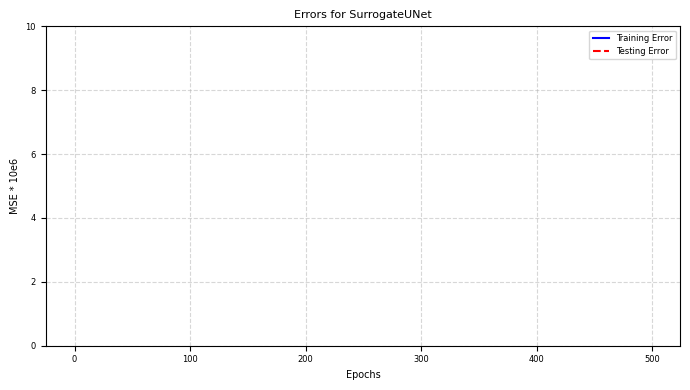

In [71]:
model_unet = SimulationModel(inputs_train, output_train,
    model = SurrogateUNet(),
    load_model_parameters=False)

model_unet.scheduler = torch.optim.lr_scheduler.LinearLR(
            model_unet.optimizer, 
            start_factor=0.05,  
            end_factor=0.0001,  
            total_iters=200)

model_unet.train(num_epochs=500, print_every=1, save_model=True)

model_unet.plot_errors()

. Perceptual Loss:

If the small change is aimed at improving the perceptual quality of the image (e.g., sharpening or enhancing details), you might want to consider using perceptual loss. Rather than focusing purely on pixel-wise loss, perceptual loss compares the features learned by a pre-trained neural network (like VGG) to assess how similar the generated image is to the target image in terms of high-level content.

    Content loss using a pretrained VGG network can be helpful in tasks like denoising or enhancing details without altering the underlying structure too much.mk

6. Attention Mechanisms:

Attention mechanisms might be helpful if the small change you're trying to introduce is spatially dependent on certain parts of the image. By focusing on key regions, attention layers can help the model modify the image in a more controlled manner.

    Self-attention layers (like in Vision Transformers) can allow the model to focus on different regions of the image based on their importance in the task.

In [ ]:
import torch
import matplotlib.pyplot as plt

# Get the model
model = model_sevenlayerconvolutional.model

# Get all convolutional layers
conv_layers = [layer for layer in model.modules() if isinstance(layer, torch.nn.Conv2d)]

def normalize_kernel(kernel):
    """Normalize kernel to 0-1 range for better visualization."""
    min_val = kernel.min()
    max_val = kernel.max()
    return (kernel - min_val) / (max_val - min_val + 1e-5)

def plot_all_kernels(conv_layers):
    num_layers = len(conv_layers)
    max_kernels = max([layer.weight.shape[0] for layer in conv_layers])

    plt.figure(figsize=(max_kernels, num_layers))

    for layer_idx, conv in enumerate(conv_layers):
        kernels = conv.weight.data.clone().cpu()  # shape: (out_channels, in_channels, H, W)
        out_channels, in_channels, h, w = kernels.shape

        for k in range(out_channels):
            # If multi-channel, average across channels for display (since input channels > 1)
            kernel_img = kernels[k]

            if in_channels > 1:
                kernel_img = kernel_img.mean(dim=0)  # Average over input channels
            else:
                kernel_img = kernel_img[0]  # shape: H x W

            kernel_img = normalize_kernel(kernel_img)

            plt.subplot(num_layers, max_kernels, layer_idx * max_kernels + k + 1)
            plt.imshow(kernel_img, cmap='gray')
            plt.axis('off')
            if layer_idx == 0:
                plt.title(f'Kernel {k+1}', fontsize=8)
        plt.ylabel(f'Layer {layer_idx+1}', rotation=0, labelpad=30, fontsize=8)

    plt.tight_layout()
    plt.show()

# Run the plotting function
plot_all_kernels(conv_layers)